In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
# Upload dataset
data_org = pd.read_csv("C:\\Users\\USER\\Desktop\\data_test_uv.CSV")

In [3]:
# Make a copy to use
data = data_org.copy()
data.head(5)

,CUOC_GOC_GPRS_210901,CUOC_GOC_GPRS_211001,CUOC_GOC_GPRS_211101,CUOC_GOC_GPRS_211201,CUOC_GOC_GPRS_220101,CUOC_GOC_GPRS_220201,CUOC_GOC_GPRS_220301,CUOC_GOC_GPRS_220401,CUOC_GOC_GPRS_220501,CUOC_GOC_GPRS_220601,...,TONG_TIEN_NAP_TOPUP_211101,TONG_TIEN_NAP_TOPUP_211201,TONG_TIEN_NAP_TOPUP_220101,TONG_TIEN_NAP_TOPUP_220201,TONG_TIEN_NAP_TOPUP_220301,TONG_TIEN_NAP_TOPUP_220401,TONG_TIEN_NAP_TOPUP_220501,TONG_TIEN_NAP_TOPUP_220601,TUOI_KHACH_HANG_cut_level_220601,user_id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,55 < X <= 65,7.029190e+11
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45 < X <= 55,3.515970e+11
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0 < X <= 15,7.235010e+11
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,200000.0,0.0,260000.0,0.0,150000.0,10000.0,0 < X <= 15,4.203840e+11
4,0.0,0.0,570.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100000.0,0.0,0.0,100000.0,0.0,0.0,0.0,100000.0,25 < X <= 35,8.207820e+11


# 1. Data preparing

## 1.1. Data checking

In [4]:
# general info of dataset
data.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 182 columns):
 #    Column                             Non-Null Count   Dtype  
---   ------                             --------------   -----  
 0    CUOC_GOC_GPRS_210901               199863 non-null  float64
 1    CUOC_GOC_GPRS_211001               199876 non-null  float64
 2    CUOC_GOC_GPRS_211101               199901 non-null  float64
 3    CUOC_GOC_GPRS_211201               199920 non-null  float64
 4    CUOC_GOC_GPRS_220101               199944 non-null  float64
 5    CUOC_GOC_GPRS_220201               199897 non-null  float64
 6    CUOC_GOC_GPRS_220301               199958 non-null  float64
 7    CUOC_GOC_GPRS_220401               199976 non-null  float64
 8    CUOC_GOC_GPRS_220501               199989 non-null  float64
 9    CUOC_GOC_GPRS_220601               200000 non-null  float64
 10   HA_TANG_210901                     199863 non-null  object 
 11   HA_TANG_211001          

In [5]:
# Check null values of each column
data.isna().sum().sort_values(ascending=False)

CUOC_GOC_GPRS_210901       137
TONG_CUOC_GOC_FN_210901    137
IS_SIM_4G_210901           137
NOD_PSLL_DATA_210901       137
NOD_PSLL_THOAI_210901      137
                          ... 
THIET_BI_220601              0
CUOC_GOC_GPRS_220601         0
TONG_CUOC_GOC_FN_220601      0
thuc_4g_220601               0
user_id                      0
Length: 182, dtype: int64

In [6]:
# Check duplicate of 'user_id'
data.duplicated('user_id').sum()

16798

### ***Comment:***
* The maximum number of null values in each column is low: 137/200000 values => Remove null values from dataset
* Values in 'user_id' columns was changed from original data for security, so some duplicated values appear => Remove those duplicate values
* Original data is organized as wide form, each field is devided into 10 columns to show infomation of 10 months => Convert dataframe form wide to long form for better manipulation. Then calculate the mean, mode of each column group by 'user_id' to combine 10 months into a single row

## 1.2. Data cleaning and transforming

### 1.2.1. Cleaning

In [7]:
# remove missing values
data.dropna(axis=0,inplace=True)

In [8]:
# remove duplicate values in 'user_id' column
data.drop_duplicates(subset ='user_id',inplace=True)

In [9]:
data.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 182967 entries, 0 to 199999
Data columns (total 182 columns):
 #    Column                             Non-Null Count   Dtype  
---   ------                             --------------   -----  
 0    CUOC_GOC_GPRS_210901               182967 non-null  float64
 1    CUOC_GOC_GPRS_211001               182967 non-null  float64
 2    CUOC_GOC_GPRS_211101               182967 non-null  float64
 3    CUOC_GOC_GPRS_211201               182967 non-null  float64
 4    CUOC_GOC_GPRS_220101               182967 non-null  float64
 5    CUOC_GOC_GPRS_220201               182967 non-null  float64
 6    CUOC_GOC_GPRS_220301               182967 non-null  float64
 7    CUOC_GOC_GPRS_220401               182967 non-null  float64
 8    CUOC_GOC_GPRS_220501               182967 non-null  float64
 9    CUOC_GOC_GPRS_220601               182967 non-null  float64
 10   HA_TANG_210901                     182967 non-null  object 
 11   HA_TANG_211001          

### 1.2.2. Transforming

***Convert dataframe form wide to long form***

In [10]:
# Convert dataframe form wide to long form
cols = ["CUOC_GOC_GPRS_","HA_TANG_","IS_DCOM_","IS_SIM_4G_","LL_THOAI_"
        ,"NOD_PSLL_DATA_","NOD_PSLL_THOAI_","SO_LAN_NAP_THE_",
        "SO_LAN_NAP_TOPUP_","SO_NGAY_SU_DUNG_","THIET_BI_","thuc_4g_",
        "TONG_CUOC_GOC_DATA_4_HUONG_","TONG_CUOC_GOC_FN_","TONG_CUOC_GOC_THOAI_",
        "TONG_LL_GPRS_","TONG_TIEN_NAP_THE_","TONG_TIEN_NAP_TOPUP_"]
long_data = pd.wide_to_long(data,cols, i='user_id',j='time').reset_index()

In [11]:
long_data.rename(columns = {'TUOI_KHACH_HANG_cut_level_220601':'TUOI_KH_'}, inplace = True)

In [40]:
long_data.info(verbose=True, show_counts=True)
long_data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1829670 entries, 0 to 1829669
Data columns (total 21 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   user_id                      1829670 non-null  float64
 1   time                         1829670 non-null  int64  
 2   TUOI_KH_                     1829670 non-null  object 
 3   CUOC_GOC_GPRS_               1829670 non-null  float64
 4   HA_TANG_                     1829670 non-null  object 
 5   IS_DCOM_                     1829670 non-null  float64
 6   IS_SIM_4G_                   1829670 non-null  float64
 7   LL_THOAI_                    1829670 non-null  float64
 8   NOD_PSLL_DATA_               1829670 non-null  float64
 9   NOD_PSLL_THOAI_              1829670 non-null  float64
 10  SO_LAN_NAP_THE_              1829670 non-null  float64
 11  SO_LAN_NAP_TOPUP_            1829670 non-null  float64
 12  SO_NGAY_SU_DUNG_             1829670 non-n

,user_id,time,TUOI_KH_,CUOC_GOC_GPRS_,HA_TANG_,IS_DCOM_,IS_SIM_4G_,LL_THOAI_,NOD_PSLL_DATA_,NOD_PSLL_THOAI_,...,SO_LAN_NAP_TOPUP_,SO_NGAY_SU_DUNG_,THIET_BI_,thuc_4g_,TONG_CUOC_GOC_DATA_4_HUONG_,TONG_CUOC_GOC_FN_,TONG_CUOC_GOC_THOAI_,TONG_LL_GPRS_,TONG_TIEN_NAP_THE_,TONG_TIEN_NAP_TOPUP_
0,7.029190e+11,210901,55 < X <= 65,0.0,-1G,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,Unknown,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0
1,3.515970e+11,210901,45 < X <= 55,0.0,-1G,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,Unknown,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0
2,7.235010e+11,210901,0 < X <= 15,0.0,2G,1.0,0.0,0.0,6.0,0.0,...,0.0,6.0,2G,0.0,0.0,0.0,0.0,1.503600e+04,0.0,0.0
3,4.203840e+11,210901,0 < X <= 15,0.0,4G,0.0,1.0,1254.0,22.0,5.0,...,0.0,30.0,4G,1.0,148000.0,256159.5,36047.5,2.599680e+10,300000.0,0.0
4,8.207820e+11,210901,25 < X <= 35,0.0,2G,4.0,0.0,0.0,29.0,0.0,...,0.0,29.0,Unknown,0.0,25000.0,25000.0,0.0,2.522611e+06,0.0,0.0


***Combine data of 10 months of each user_id into a single row***

In [13]:
# calculate the mean/mode of each column group by 'user_id' to combine 10 months into a single row
summary = long_data.groupby(['user_id','TUOI_KH_']).agg({
        'CUOC_GOC_GPRS_': 'mean',
        'HA_TANG_': lambda x: x.mode()[0],
        'IS_DCOM_': lambda x: x.mode()[0],
        'IS_SIM_4G_': lambda x: x.mode()[0],
        'LL_THOAI_': 'mean',
        'NOD_PSLL_DATA_': 'mean',
        'NOD_PSLL_THOAI_': 'mean',
        'SO_LAN_NAP_THE_': 'mean',
        'SO_LAN_NAP_TOPUP_': 'mean',
        'SO_NGAY_SU_DUNG_': 'mean',
        'THIET_BI_': lambda x: x.mode()[0],
        'thuc_4g_': lambda x: x.mode()[0],
        'TONG_CUOC_GOC_DATA_4_HUONG_': 'mean', 
        'TONG_CUOC_GOC_FN_': 'mean',
        'TONG_CUOC_GOC_THOAI_': 'mean', 
        'TONG_LL_GPRS_': 'mean',
        'TONG_TIEN_NAP_THE_': 'mean',
        'TONG_TIEN_NAP_TOPUP_': 'mean'}).reset_index()
summary.head(5)

,user_id,TUOI_KH_,CUOC_GOC_GPRS_,HA_TANG_,IS_DCOM_,IS_SIM_4G_,LL_THOAI_,NOD_PSLL_DATA_,NOD_PSLL_THOAI_,SO_LAN_NAP_THE_,SO_LAN_NAP_TOPUP_,SO_NGAY_SU_DUNG_,THIET_BI_,thuc_4g_,TONG_CUOC_GOC_DATA_4_HUONG_,TONG_CUOC_GOC_FN_,TONG_CUOC_GOC_THOAI_,TONG_LL_GPRS_,TONG_TIEN_NAP_THE_,TONG_TIEN_NAP_TOPUP_
0,12540981.0,25 < X <= 35,0.0,4G,0.0,1.0,1796.9,12.8,14.2,1.7,0.5,27.6,4G,0.0,27500.0,94095.754,56060.754,4.807343e+09,80000.0,35000.0
1,19270570.0,25 < X <= 35,0.0,3G,0.0,1.0,2907.7,0.0,20.2,1.0,0.1,20.4,4G,0.0,0.0,34869.240,32350.040,0.000000e+00,37000.0,1000.0
2,25176536.0,55 < X <= 65,0.0,4G,0.0,1.0,1443.3,15.6,13.8,0.7,0.0,30.3,4G,1.0,0.0,60843.951,36744.651,6.049138e+06,50000.0,0.0
3,33798232.0,35 < X <= 45,0.0,4G,0.0,1.0,288.7,9.0,1.8,0.3,0.1,12.7,4G,0.0,11000.0,21000.781,2500.781,2.682394e+09,20000.0,10000.0
4,42212796.0,45 < X <= 55,0.0,2G,0.0,1.0,142.1,0.8,3.7,0.2,0.0,17.4,2G,0.0,0.0,4344.215,2464.707,2.369239e+06,4000.0,0.0


# 2. EDA and features selection

## 2.1. EDA


### 2.1.1 Overview of the data

In [ ]:
!pip install ydata-profiling

In [14]:
from ydata_profiling import ProfileReport
prof = ProfileReport(summary)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Comment
- Dataset no longer has missing values and duplicate rows.
- The heatmap shows that 'HA_TANG_', 'THIET_BI_', 'NOD_PSLL_DATA_', 'SO_NGAY_SU_DUNG_' have a high correlation with the target column 'thuc_4g_'. But 'HA_TANG_' and 'THIET_BI_' are correlated, -> we choose 1 of these 2 features.

=> Choose 'HA_TANG_', 'NOD_PSLL_DATA_' and 'SO_NGAY_SU_DUNG_' to apply to the model.
- There are some columns that we think may affect the target "thuc_4g" ('NOD_PSLL_THOAI_', 'TUOI_KH_', 'IS_DCOM_') => EDA to check the relation with the "thuc_4g" column.

### 2.1.2. EDA to select more features

Define the cal_pct(data, groupby_col) function to return a dataframe showing the percentage of 4G customers among total customers grouped by a specific column.
Input: 
- data: dataframe
- groupby_col: the category column needs to be groupby

In [15]:
def cal_pct(data, groupby_col):
    
    no_4G = data.query('thuc_4g_==0').groupby(groupby_col).agg(count_no4G=('user_id','count')).reset_index()
    using_4G = data.query('thuc_4g_==1').groupby(groupby_col).agg(count_4G=('user_id','count')).reset_index()
    
    df_4G = no_4G.merge(using_4G, on = groupby_col, how = 'outer')
    
    df_4G['%4G'] = df_4G['count_4G']/(df_4G['count_4G'] + df_4G['count_no4G'])
    
    return df_4G.sort_values('%4G',ascending = False)
    

NOD_PSLL_THOAI_

In [16]:
# Calculate percentage of 4G customers of each NOD_PSLL_THOAI_ value
thoai_df = cal_pct(summary,'NOD_PSLL_THOAI_')
thoai_df

,NOD_PSLL_THOAI_,count_no4G,count_4G,%4G
301,30.1,108,343,0.760532
300,30.0,112,328,0.745455
297,29.7,104,278,0.727749
298,29.8,113,284,0.715365
302,30.2,155,384,0.712430
...,...,...,...,...
2,0.2,1471,172,0.104687
3,0.3,1267,141,0.100142
4,0.4,1262,126,0.090778
1,0.1,1906,182,0.087165


In [17]:
thoai_df['%4G'].describe()

count    304.000000
mean       0.551404
std        0.139425
min        0.069311
25%        0.546863
50%        0.594294
75%        0.620325
max        0.760532
Name: %4G, dtype: float64

<Axes: ylabel='%4G'>

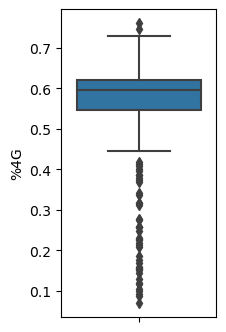

In [39]:
fig, ax = plt.subplots(1, figsize = (2,4))
sns.boxplot(data=thoai_df,y='%4G')

- As monitoring, we found that the percentage of all 'NOD_PSLL_THOAI_' values is quite the same (the mean ~ the median and the std is quite small).However, it still has some outliers (shown on boxplot) so we may keep this features to the model
- As heatmap show that there is correlation between 'NOD_PSLL_THOAI_' and 'SO_NGAY_SU_DUNG_' so we need to check VIF of these features, If VIF > 10, we can keep only 'SO_NGAY_SU_DUNG_' and drop 'NOD_PSLL_THOAI_'

In [21]:
# Check VIF of 'NOD_PSLL_THOAI_' and 'SO_NGAY_SU_DUNG_'

import statsmodels.stats.outliers_influence as infl

vifs = infl.variance_inflation_factor(summary[['SO_NGAY_SU_DUNG_','NOD_PSLL_THOAI_']], exog_idx=[1])

# Print the VIFs
print(vifs)

3.2277512941273834


***VIF < 10 => choose 'NOD_PSLL_THOAI_' to apply to the model***

TUOI_KH_

In [22]:
# Calculate percentage of 4G customers of each 'TUOI_KH_' value
tuoi_df = cal_pct(summary,'TUOI_KH_')
tuoi_df

,TUOI_KH_,count_no4G,count_4G,%4G
1,15 < X <= 25,7184,11474,0.614964
2,25 < X <= 35,23852,27398,0.534595
3,35 < X <= 45,24675,22035,0.471741
4,45 < X <= 55,17830,13708,0.434650
5,55 < X <= 65,12851,7474,0.367724
0,0 < X <= 15,1668,941,0.360675
8,X <= 0,15,8,0.347826
6,65 < X <= 75,6548,2676,0.290113
7,75 < X,2032,598,0.227376


In [23]:
tuoi_df['%4G'].describe()

count    9.000000
mean     0.405518
std      0.121235
min      0.227376
25%      0.347826
50%      0.367724
75%      0.471741
max      0.614964
Name: %4G, dtype: float64

<Axes: >

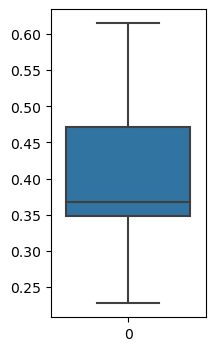

In [24]:
fig, ax = plt.subplots(1, figsize = (2,4))
sns.boxplot(data=tuoi_df['%4G'])


As the boxplot shows, the percentage of 4G customers between ages groups is not significantly different => We can conclude that customers age has no relationship with target column

IS_DCOM_

In [25]:
# Calculate percentage of 4G customers of each 'IS_DCOM_' value
dcom = cal_pct(summary,'IS_DCOM_')
dcom

,IS_DCOM_,count_no4G,count_4G,%4G
1,0.0,95256,85875.0,0.474104
2,1.0,888,428.0,0.325228
4,4.0,318,9.0,0.027523
0,-1.0,41,NaN,NaN
3,2.0,151,NaN,NaN
5,5.0,1,NaN,NaN


In [26]:
dcom['%4G'].describe()

count    3.000000
mean     0.275618
std      0.227386
min      0.027523
25%      0.176375
50%      0.325228
75%      0.399666
max      0.474104
Name: %4G, dtype: float64

<Axes: >

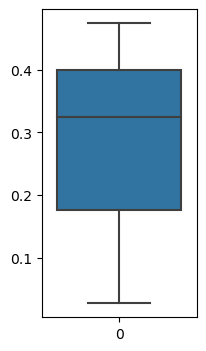

In [27]:
fig, ax = plt.subplots(1, figsize = (2,4))
sns.boxplot(data=dcom['%4G'])

As the boxplot shows, the percentage of 4G customers between dcom groups is not significantly different => We can conclude that dcom has no relationship with target column

## 2.2. Features selection

After EDA we will keep the below columns to the model:
- 'HA_TANG_': The infrastructure used by customer. 2G-3G is an old technology, 4G is a new technology in the future 
- 'NOD_PSLL_DATA_': Number of days using data in that month
- 'NOD_PSLL_THOAI_': Number of days using voice calls in that month
- 'SO_NGAY_SU_DUNG_': Number of days using one of their services: Voice, Data, SMS
- 'thuc_4g_': target column

# 3. Encoding and Normalizing

In [28]:
df= summary[['HA_TANG_','NOD_PSLL_DATA_','NOD_PSLL_THOAI_',
            'SO_NGAY_SU_DUNG_','thuc_4g_']]

## 3.1. Encoding

In [29]:
categorical_cols = ['HA_TANG_']
df = pd.get_dummies(df, columns = categorical_cols, drop_first=True)


## 3.2. Normalizing

In [30]:
X = df.drop('thuc_4g_',axis=1)
y = df['thuc_4g_']

In [31]:
from sklearn.preprocessing import MinMaxScaler
X = MinMaxScaler().fit_transform(X)

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=21, stratify=y)

# 4. Apply to the model

In [33]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## 4.1. Logistic Regression

In [34]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train,y_train)

y_pred_train_lr = lr.predict(X_train)
y_pred_test_lr = lr.predict(X_test)

print(f'Balance accuracy of train set: {balanced_accuracy_score(y_train, y_pred_train_lr)}')
print(f'Balance accuracy of test set: {balanced_accuracy_score(y_test, y_pred_test_lr)}')



Balance accuracy of train set: 0.9302577844127036
Balance accuracy of test set: 0.9296896487154414


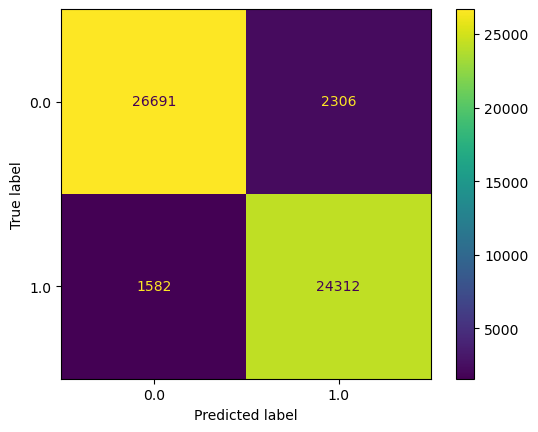

In [35]:
cm_lr = confusion_matrix(y_test, y_pred_test_lr, labels=lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=lr.classes_)
disp.plot()


## 4.2. K Nearest Neighbors (KNN)

Balance accuracy of train set: 0.9455928564301862
Balance accuracy of test set: 0.9254360738942216


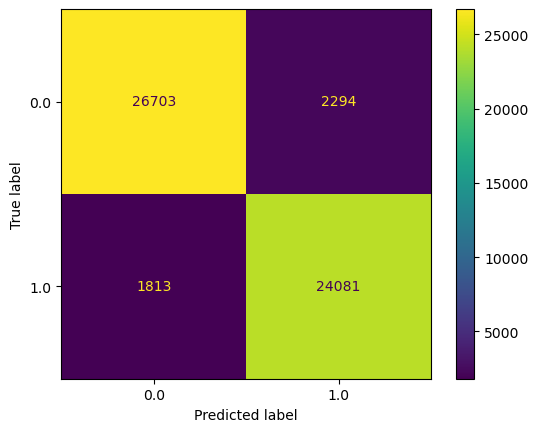

In [36]:
# KNN
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier()
KNN.fit(X_train,y_train)

y_pred_train_KNN = KNN.predict(X_train)
y_pred_test_KNN = KNN.predict(X_test)

print(f'Balance accuracy of train set: {balanced_accuracy_score(y_train, y_pred_train_KNN)}')
print(f'Balance accuracy of test set: {balanced_accuracy_score(y_test, y_pred_test_KNN)}')

cm_KNN = confusion_matrix(y_test, y_pred_test_KNN, labels=KNN.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_KNN, display_labels=KNN.classes_)
disp.plot()


## 4.3. Decision Tree

Balance accuracy of train set: 0.9902356667695666
Balance accuracy of test set: 0.9044094615658445


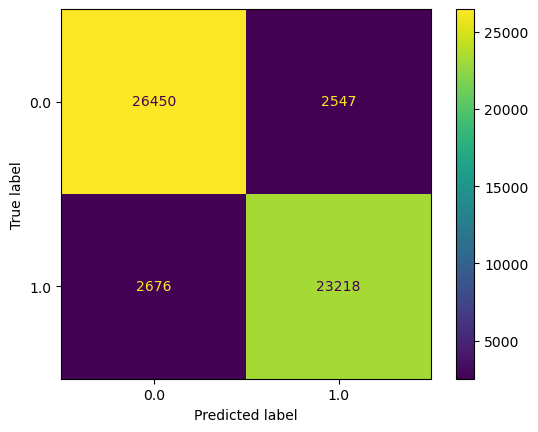

In [37]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
dt.fit(X_train,y_train)

y_pred_train_dt = dt.predict(X_train)
y_pred_test_dt = dt.predict(X_test)

print(f'Balance accuracy of train set: {balanced_accuracy_score(y_train, y_pred_train_dt)}')
print(f'Balance accuracy of test set: {balanced_accuracy_score(y_test, y_pred_test_dt)}')

cm_dt = confusion_matrix(y_test, y_pred_test_dt, labels=dt.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_dt, display_labels=dt.classes_)
disp.plot()

## 4.4. Random Forest

Balance accuracy of train set: 0.9904986500967301
Balance accuracy of test set: 0.9228699777149931


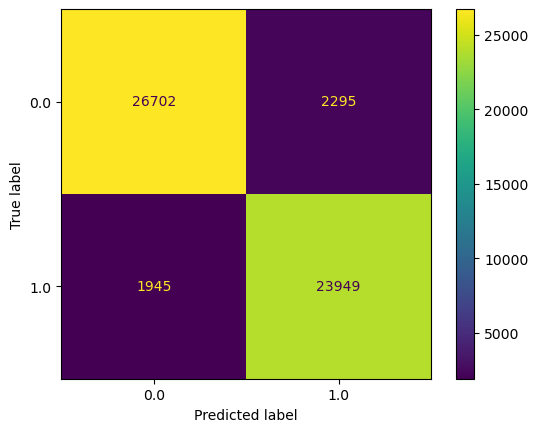

In [38]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier()
forest.fit(X_train,y_train)

y_pred_train_forest = forest.predict(X_train)
y_pred_test_forest = forest.predict(X_test)

print(f'Balance accuracy of train set: {balanced_accuracy_score(y_train, y_pred_train_forest)}')
print(f'Balance accuracy of test set: {balanced_accuracy_score(y_test, y_pred_test_forest)}')

cm_forest = confusion_matrix(y_test, y_pred_test_forest, labels=forest.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_forest, display_labels=forest.classes_)
disp.plot()

# 5. Model evaluating

Comparing the balance accuracy of 4 models, we can see that Logistic Regression has the highest test set's F1-score (0.929). Logistic Regression also has the least difference between the F1-score of the test set and the train set (0.929 and 0.93, respectively).

=> Choose **Logistic Regression** as the final model used to predict 4G service customers for this corporation.